# Import Modules

In [2]:
import pandas as pd
import numpy as np
import os
import cv2
import glob
import matplotlib.pyplot as plt
import warnings
import tensorflow as tf
from tensorflow.keras import backend as B
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array, ImageDataGenerator
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.callbacks import Callback

from ipynb.fs.full.utils import *

# Variables Initialization and Data Description

In [4]:
train_path = './dataset/20train'
test_path = './dataset/20test'
valid_path = './dataset/20valid'
nr_birds = 20

# describe_data();

In [32]:
# show size of the images 
img = load_img('./dataset/20test/AMERICAN REDSTART/1.jpg')
print(img.size)

(224, 224)


['CREAM COLORED WOODPECKER', 'CAMPO FLICKER', 'RUFUOS MOTMOT', 'WHITE TAILED TROPIC', 'KOOKABURRA', 'TREE SWALLOW', 'AMERICAN REDSTART', 'EASTERN TOWEE', 'IBERIAN MAGPIE', 'HOOPOES', 'BELTED KINGFISHER', 'CRESTED CARACARA', 'IMPERIAL SHAQ', 'VIOLET GREEN SWALLOW', 'CAPE MAY WARBLER', 'EASTERN MEADOWLARK', 'EUROPEAN GOLDFINCH', 'HOATZIN', 'TAIWAN MAGPIE', 'RED BELLIED PITTA', '.DS_Store']


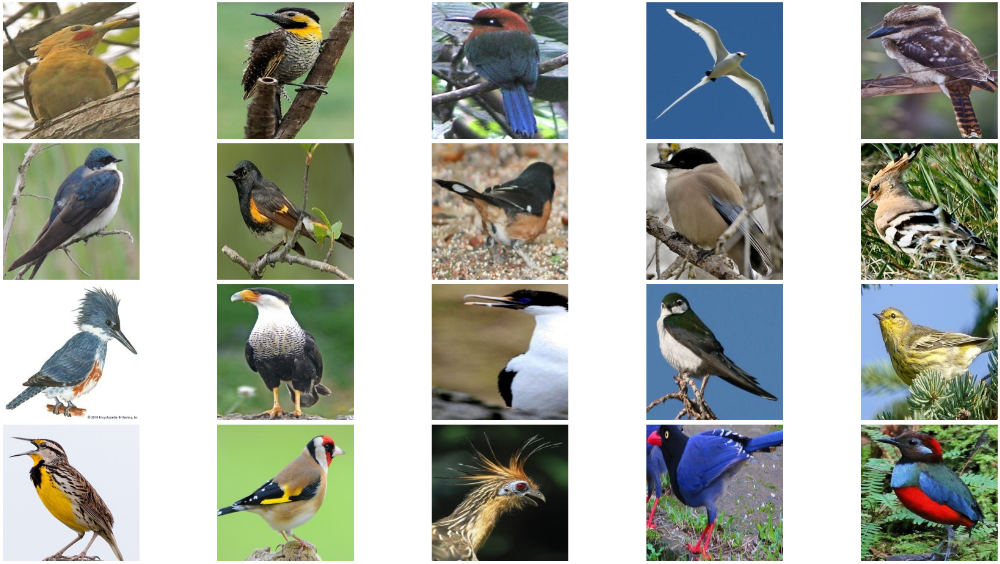

In [6]:
# select random images from each class in ./dataset/20train/class/
class_names = os.listdir(train_path)
print(class_names)
random_images = []
for i in range(nr_birds):
    # gen random number within 50
    random_number = np.random.randint(0, 50)
    # get the image name
    random_image = os.listdir(train_path + '/' + class_names[i])[random_number]
    full_path = train_path + '/' + class_names[i] + '/' + random_image
    random_images.append(full_path)
     
# plot the images
fig, axes = plt.subplots(4, 5, figsize=(40, 20))
axes = axes.flatten()
for img, ax in zip(random_images, axes):
    ax.imshow(plt.imread(img))
    ax.set_title(img.split('.')[0])
    ax.axis('off')
plt.tight_layout()
plt.show()


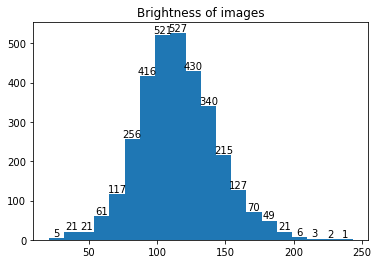

In [7]:
# calculate brighness of each image
brightness = []
for i in range(nr_birds):
    for image in os.listdir(train_path + '/' + class_names[i]):
        img = cv2.imread(train_path + '/' + class_names[i] + '/' + image)
        brightness.append(np.mean(img))
        
plt.hist(brightness, bins=20)
plt.bar_label(plt.gca().containers[0])
plt.title('Brightness of images')
plt.show()

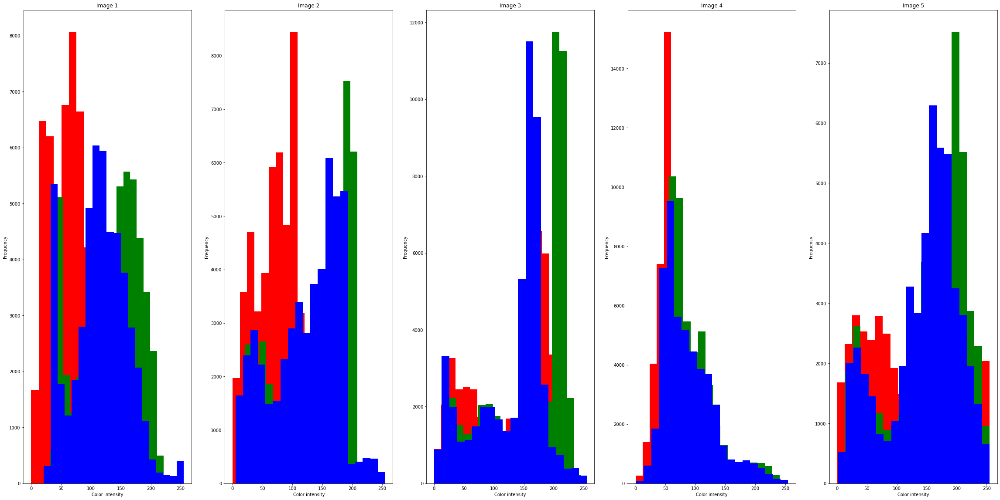

In [8]:
# select 5 images from american redstart
american_redstart = os.listdir(train_path + '/AMERICAN REDSTART')
american_redstart = [train_path + '/AMERICAN REDSTART/' + image for image in american_redstart]
american_redstart = american_redstart[:5]

# plot the color channels of the images
# extract the color channels
red = []
green = []
blue = []
for img in american_redstart:
    img = cv2.imread(img)
    red.append(img[:,:,0])
    green.append(img[:,:,1])
    blue.append(img[:,:,2])

# plot the color channels distribution
fig, axes = plt.subplots(1, 5, figsize=(40, 20))
axes = axes.flatten()
for i in range(5):
    axes[i].hist(red[i].flatten(), bins=20, color='red')
    axes[i].hist(green[i].flatten(), bins=20, color='green')
    axes[i].hist(blue[i].flatten(), bins=20, color='blue')
    axes[i].set_title('Image ' + str(i+1))
    axes[i].set_xlabel('Color intensity')
    axes[i].set_ylabel('Frequency')
    


['./dataset/20train/AMERICAN REDSTART/016.jpg', './dataset/20train/AMERICAN REDSTART/002.jpg', './dataset/20train/AMERICAN REDSTART/003.jpg', './dataset/20train/AMERICAN REDSTART/017.jpg', './dataset/20train/AMERICAN REDSTART/029.jpg']


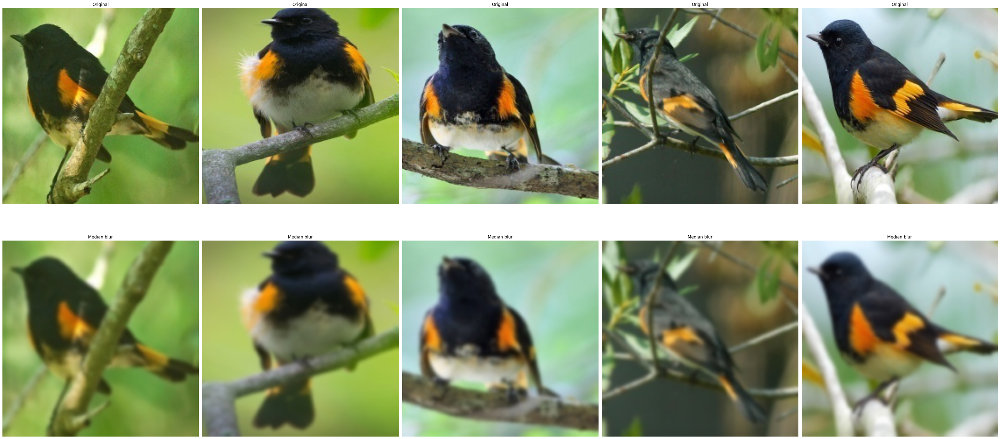

In [34]:
# simulate a gausion noise

# select 5 images from american redstart
american_redstart = os.listdir(train_path + '/AMERICAN REDSTART')
american_redstart = [train_path + '/AMERICAN REDSTART/' + image for image in american_redstart]
american_redstart = american_redstart[:5]

print(american_redstart)
 
# cv2 median blur
median_blur = []
for img in american_redstart:
    img = cv2.imread(img)
    median_blur.append(cv2.medianBlur(img, 5))
     
# cv2 gaussian blur
gaussian_blur = []
for img in american_redstart:

    img = cv2.imread(img)
    # convert to rgb
    blur = cv2.GaussianBlur(img, (5,5), 0)
    blur = cv2.GaussianBlur(blur, (5,5), 0)
    blur = cv2.GaussianBlur(blur, (5,5), 0)
    blur = cv2.GaussianBlur(blur, (5,5), 0)
    blur = cv2.cvtColor(blur, cv2.COLOR_BGR2RGB)
    gaussian_blur.append(blur)

# plot the images
fig, axes = plt.subplots(2, 5, figsize=(40, 20))
axes = axes.flatten() 
for i in range(5):
    axes[i].imshow(plt.imread(american_redstart[i]))
    axes[i].set_title('Original')
    axes[i].axis('off')
    axes[i+5].imshow(gaussian_blur[i])
    axes[i+5].set_title('Median blur')
    axes[i+5].axis('off')
    
plt.tight_layout()
plt.show()


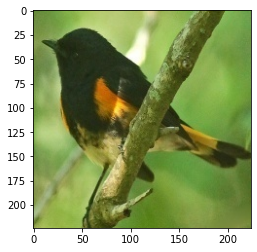

In [37]:
#plotting one image
img = cv2.imread('./dataset/20train/AMERICAN REDSTART/016.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

Class:  CREAM COLORED WOODPECKER
Red-Green correlation:  0.8337344335615037
Red-Blue correlation:  0.7601344483525753
Green-Blue correlation:  0.9309121122981188


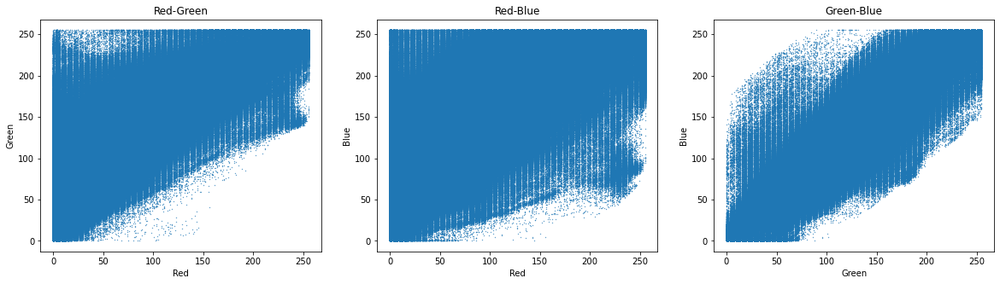

Class:  CAMPO FLICKER
Red-Green correlation:  0.8305569306418858
Red-Blue correlation:  0.6846117056578447
Green-Blue correlation:  0.9242223971168134


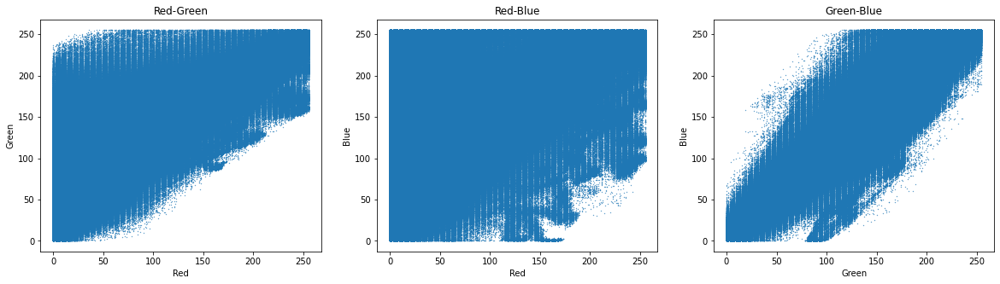

Class:  RUFUOS MOTMOT
Red-Green correlation:  0.7910087614902694
Red-Blue correlation:  0.6916769915615455
Green-Blue correlation:  0.8465069589085401


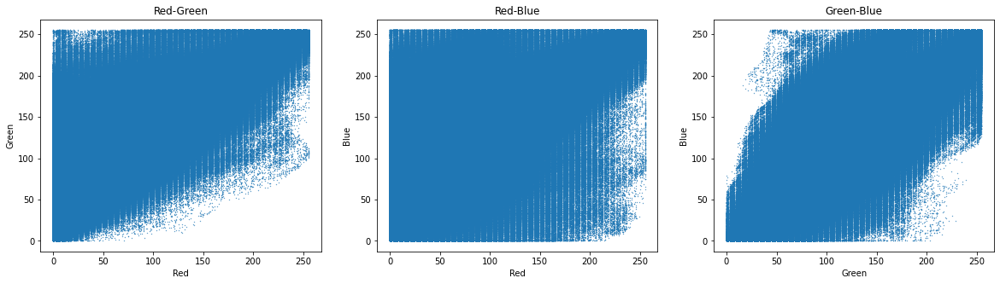

Class:  WHITE TAILED TROPIC
Red-Green correlation:  0.8965768401180527
Red-Blue correlation:  0.713126366663631
Green-Blue correlation:  0.9294315348827965


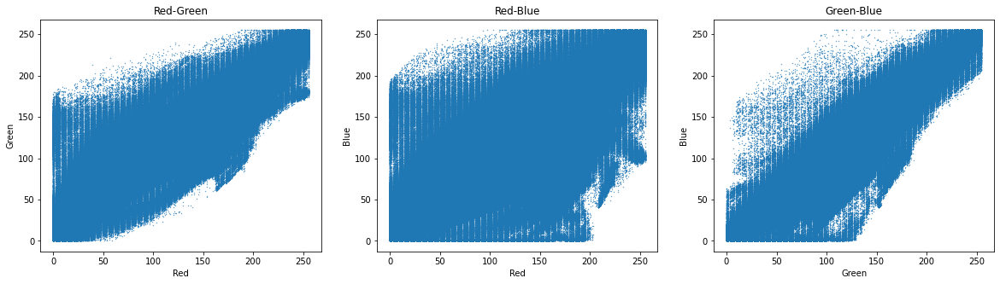

Class:  KOOKABURRA
Red-Green correlation:  0.9175274315393163
Red-Blue correlation:  0.8854704727109
Green-Blue correlation:  0.9588254258202509


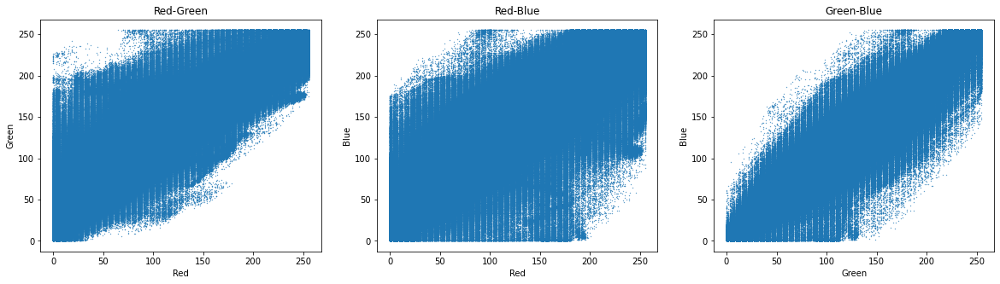

Class:  TREE SWALLOW
Red-Green correlation:  0.8582093406806358
Red-Blue correlation:  0.7809750859074175
Green-Blue correlation:  0.9386872512479018


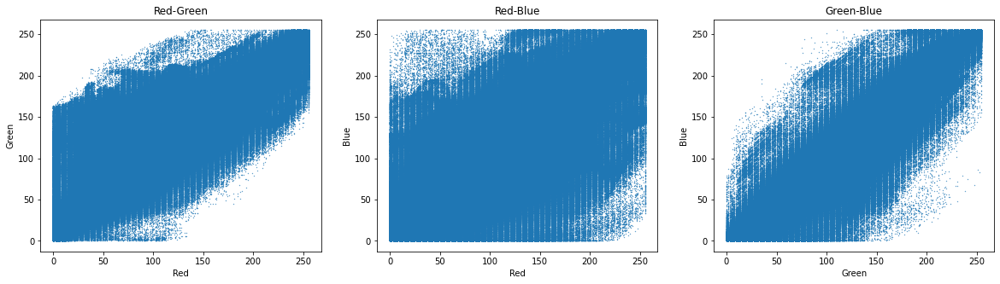

Class:  AMERICAN REDSTART
Red-Green correlation:  0.7798776149627668
Red-Blue correlation:  0.7514400273685877
Green-Blue correlation:  0.9190158160001555


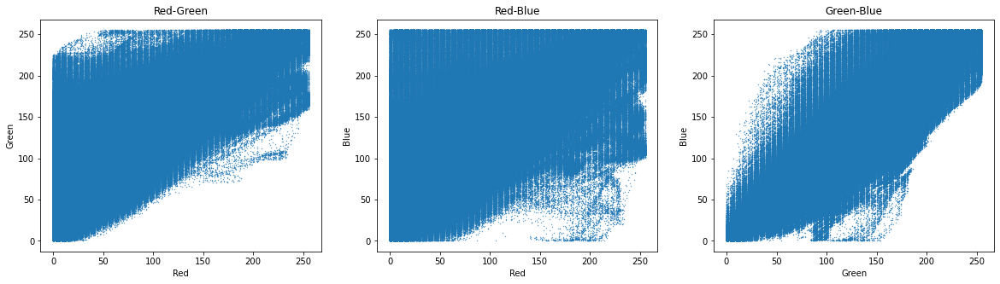

Class:  EASTERN TOWEE
Red-Green correlation:  0.8609405478880703
Red-Blue correlation:  0.8138793021233794
Green-Blue correlation:  0.912332479471653


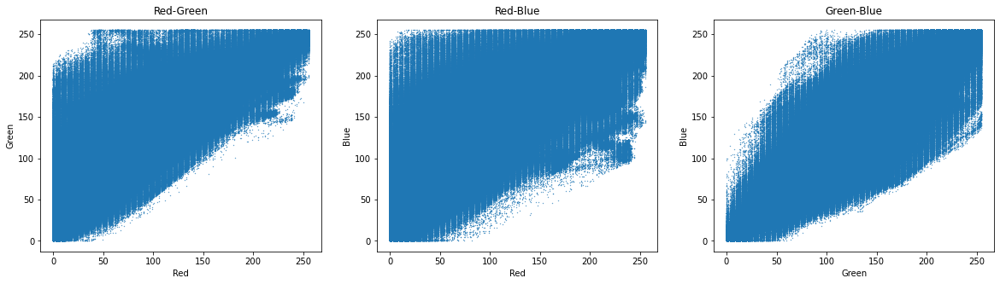

Class:  IBERIAN MAGPIE
Red-Green correlation:  0.8408846891134351
Red-Blue correlation:  0.6789758754709021
Green-Blue correlation:  0.9176901681978605


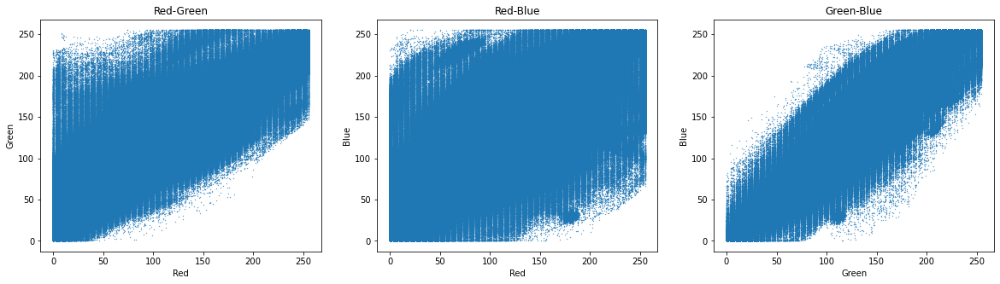

Class:  HOOPOES
Red-Green correlation:  0.870565229598109
Red-Blue correlation:  0.7918812409499122
Green-Blue correlation:  0.9126302331307213


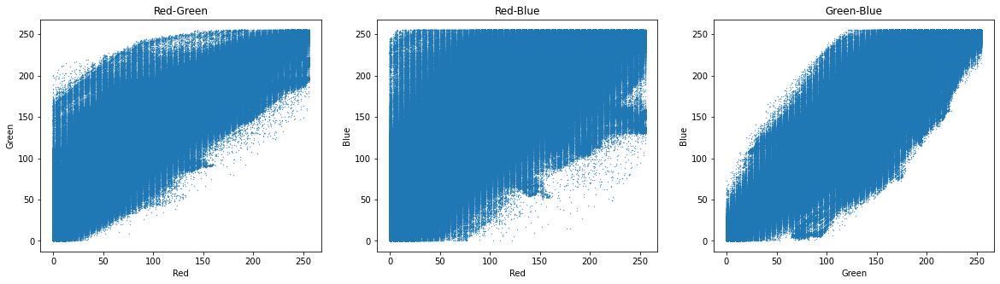

Class:  BELTED KINGFISHER
Red-Green correlation:  0.872980461921073
Red-Blue correlation:  0.7290829420561056
Green-Blue correlation:  0.9336706708729515


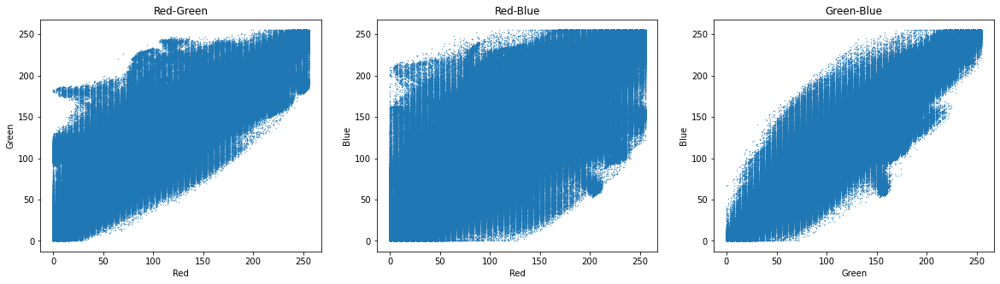

Class:  CRESTED CARACARA
Red-Green correlation:  0.8627263377786477
Red-Blue correlation:  0.7291793558603673
Green-Blue correlation:  0.9224015924383238


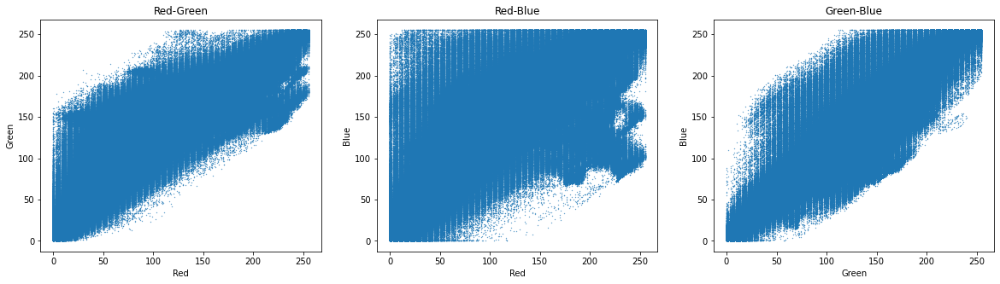

Class:  IMPERIAL SHAQ
Red-Green correlation:  0.9618712290144618
Red-Blue correlation:  0.8751753943400716
Green-Blue correlation:  0.964618641770297


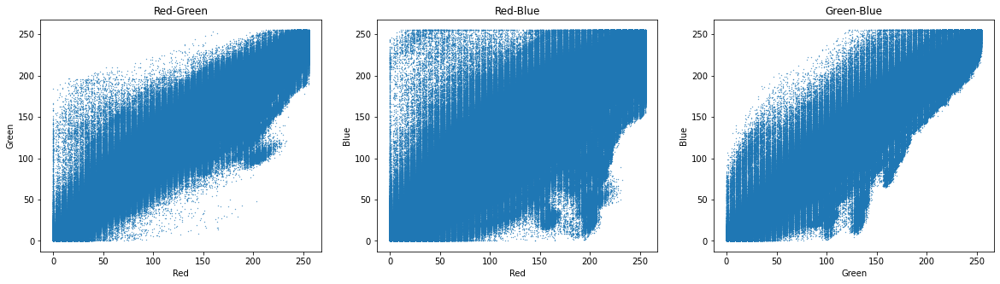

Class:  VIOLET GREEN SWALLOW
Red-Green correlation:  0.8869926956956881
Red-Blue correlation:  0.799023400252687
Green-Blue correlation:  0.9330777586753088


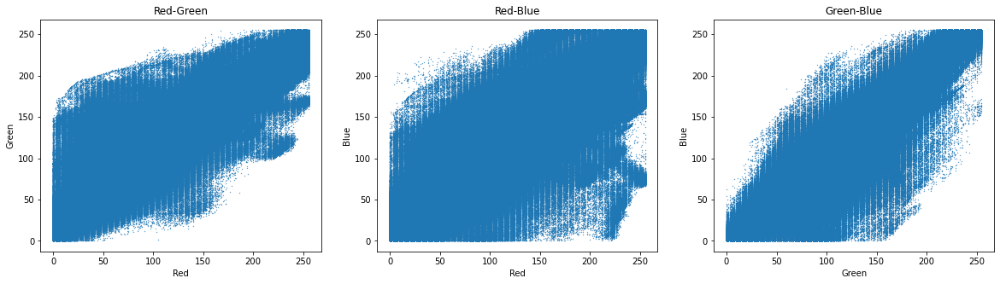

Class:  CAPE MAY WARBLER
Red-Green correlation:  0.7875049156997618
Red-Blue correlation:  0.7087140194679624
Green-Blue correlation:  0.940131381389173


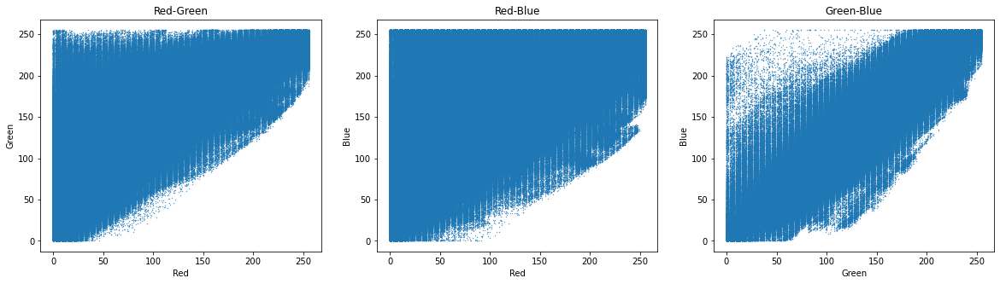

Class:  EASTERN MEADOWLARK
Red-Green correlation:  0.7587100110973918
Red-Blue correlation:  0.6093090800975309
Green-Blue correlation:  0.9267433696944029


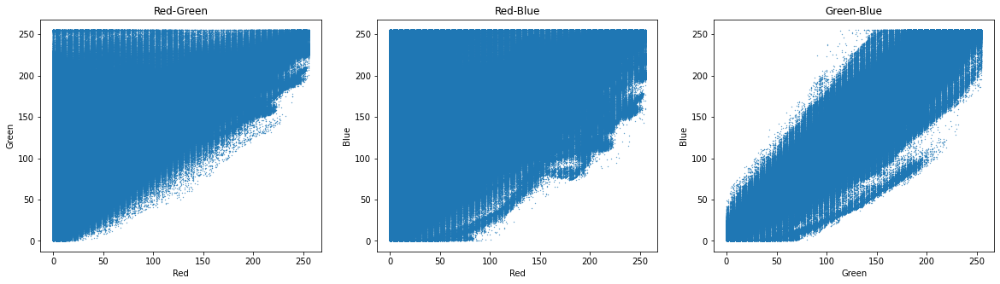

Class:  EUROPEAN GOLDFINCH
Red-Green correlation:  0.8360550994301555
Red-Blue correlation:  0.7594405467257311
Green-Blue correlation:  0.9176898830644133


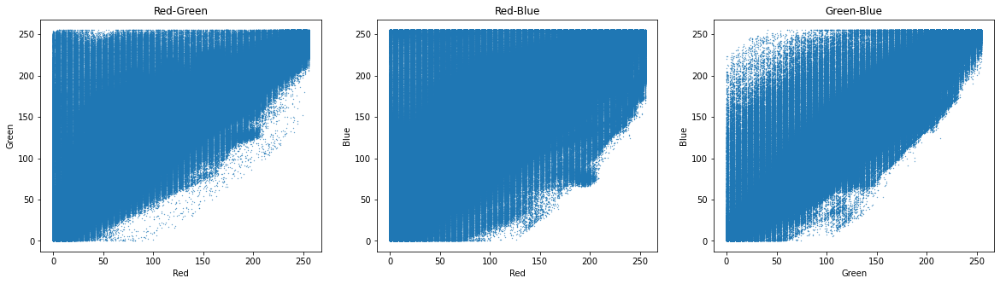

Class:  HOATZIN
Red-Green correlation:  0.8252170120298533
Red-Blue correlation:  0.771461317917782
Green-Blue correlation:  0.8826546460728966


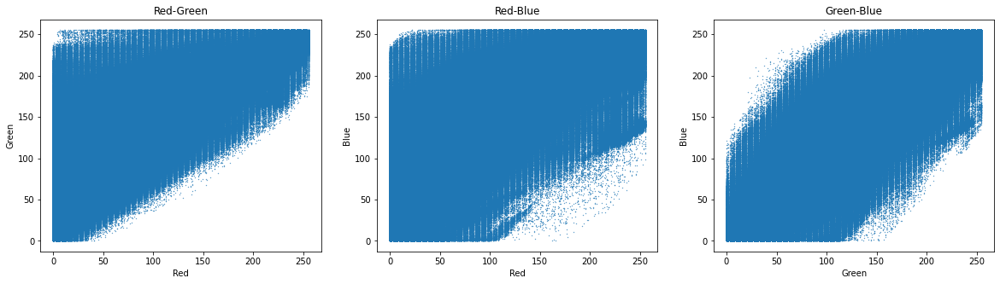

Class:  TAIWAN MAGPIE
Red-Green correlation:  0.7423040253872064
Red-Blue correlation:  0.7756639655822511
Green-Blue correlation:  0.9400763921390106


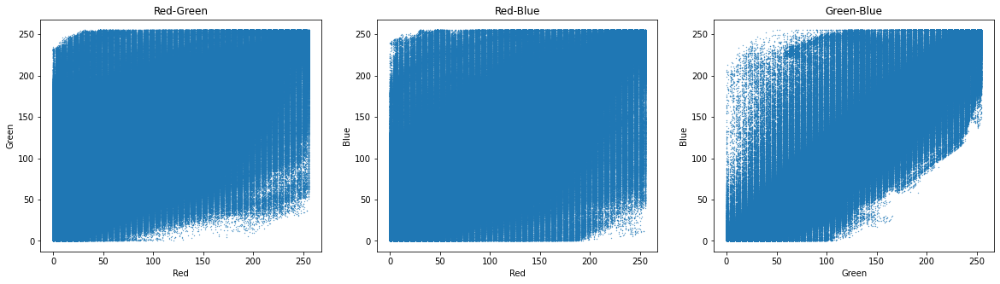

Class:  RED BELLIED PITTA
Red-Green correlation:  0.8148815241715751
Red-Blue correlation:  0.5755241631348732
Green-Blue correlation:  0.6911609231287688


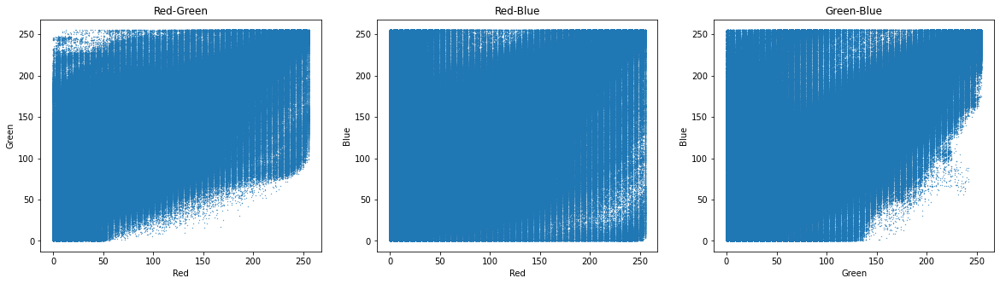

In [19]:
# find correlation between color channels and class
# extract the color channels

for i in range(nr_birds):
  red = []
  green = []
  blue = []
  
  for image in os.listdir(train_path + '/' + class_names[i]):
      img = cv2.imread(train_path + '/' + class_names[i] + '/' + image)
      red.append(img[:,:,0].flatten())
      green.append(img[:,:,1].flatten())
      blue.append(img[:,:,2].flatten())
      
  # calculate the correlation
  red = np.array(red)
  green = np.array(green)
  blue = np.array(blue)
  red_green = np.corrcoef(red.flatten(), green.flatten())[0,1]
  red_blue = np.corrcoef(red.flatten(), blue.flatten())[0,1]
  green_blue = np.corrcoef(green.flatten(), blue.flatten())[0,1]
  print('Class: ', class_names[i])
  print('Red-Green correlation: ', red_green)
  print('Red-Blue correlation: ', red_blue)
  print('Green-Blue correlation: ', green_blue)
  # plot scatter plot of the color channels
  fig, axes = plt.subplots(1, 3, figsize=(20, 5))
  axes = axes.flatten()
  # color it from red to green to blue
  axes[0].scatter(red.flatten(), green.flatten(), s=0.1, cmap='viridis')
  axes[0].set_title('Red-Green')
  axes[0].set_xlabel('Red')
  axes[0].set_ylabel('Green')
  axes[1].scatter(red.flatten(), blue.flatten(), s=0.1)
  axes[1].set_title('Red-Blue')
  axes[1].set_xlabel('Red')
  axes[1].set_ylabel('Blue')
  axes[2].scatter(green.flatten(), blue.flatten(), s=0.1)
  axes[2].set_title('Green-Blue')
  axes[2].set_xlabel('Green')
  axes[2].set_ylabel('Blue')
  plt.show()

# Prepare Generators

Found 3209 images belonging to 20 classes.
Found 100 images belonging to 20 classes.
Found 100 images belonging to 20 classes.


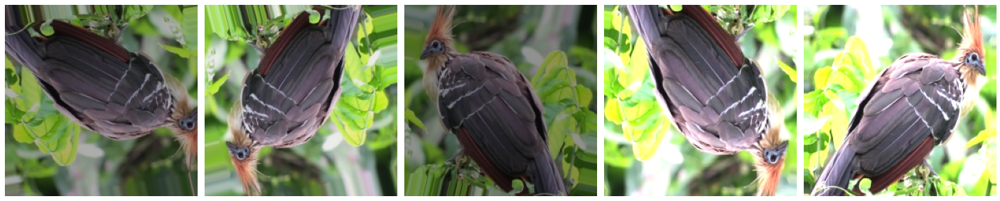

In [3]:
# Data augmentation
train_datagen = ImageDataGenerator(
  rescale=1/255,
  horizontal_flip=True,
  vertical_flip=True,
  rotation_range=15,
  zoom_range=0.1,
  brightness_range=[0.5, 1.5],
)
valid_datagen = ImageDataGenerator(rescale=1/255)
test_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
  train_path,
  target_size=(224, 224),
  batch_size=64,
  color_mode='rgb',
  class_mode='categorical',
  shuffle=True
)

validation_generator = valid_datagen.flow_from_directory(
  valid_path,
  target_size=(224, 224),
  batch_size=32,
  color_mode='rgb',
  class_mode='categorical',
  shuffle=False
)

test_generator = test_datagen.flow_from_directory(
  test_path,
  target_size=(224, 224),
  batch_size=32,
  color_mode='rgb',
  class_mode='categorical',
  shuffle=False
  )

def plotImages(images_arr):
  fig, axes = plt.subplots(1, 5, figsize=(20,20))
  axes = axes.flatten()
  for img, ax in zip(images_arr, axes):
      ax.imshow(img)
      ax.axis('off')
  plt.tight_layout()
  plt.show()
    
augmented_images = [train_generator[0][0][0] for i in range(5)]
plotImages(augmented_images)

# Load pre-trained Model, Build model and Train model

In [4]:
base_mobilenet = MobileNet(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

for layer in base_mobilenet.layers:
  layer.trainable = False

# base_mobilenet.trainable = False
base_mobilenet.summary()

new_model = Sequential()
new_model.add(base_mobilenet)

new_model.add(Flatten()) 
new_model.add(Activation('relu'))
new_model.add(Dropout(0.2))
new_model.add(Dense(nr_birds)) 
new_model.add(Activation('softmax'))
new_model.summary()

new_model.compile(SGD(lr=0.0001, momentum=0.9, nesterov=True), loss='categorical_crossentropy', metrics=['accuracy'])

def evaluate(model, optimizer):
  test_loss, test_acc = model.evaluate(test_generator)
  result = "Using " + optimizer + " We obtained: " + "Test Accuracy:", test_acc, "Test Loss:", test_loss
  print(result)
  return result

def lr_scheduler(epoch, lr):
  if epoch < 5:
    return lr
  else:
    return lr * tf.math.exp()
  
class EarlyStoppingByLossVal(Callback):
  def __init__(self, monitor='val_loss', value=0.00001, verbose=0):
    super(Callback, self).__init__()
    self.monitor = monitor
    self.value = value
    self.verbose = verbose
      

  def on_epoch_end(self, epoch, logs={}):
    current = logs.get(self.monitor)
    if current is None:
        warnings.warn("Early stopping requires %s available!" % self.monitor, RuntimeWarning)

    if current < self.value:
        if self.verbose > 0:
            print("Epoch %05d: early stopping THR" % epoch)
        self.model.stop_training = True
        
checkpointer = ModelCheckpoint(filepath='./checkpoints/mobile_net_birds.model.h5', save_best_only=True)

Metal device set to: Apple M1

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB



2023-01-19 02:33:45.325266: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-01-19 02:33:45.325992: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                         

/Users/shaun/miniforge3/lib/python3.9/site-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [6]:
SgdHistory = new_model.fit_generator(train_generator, epochs=30, validation_data=validation_generator, verbose=1, callbacks=[checkpointer, EarlyStoppingByLossVal(monitor='val_loss', value=0.1, verbose=1)])
SgdTestResult = evaluate(new_model, "SGD")
B.clear_session()

new_model.compile(Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
AdamHistory = new_model.fit_generator(train_generator, epochs=30, validation_data=validation_generator, verbose=1, callbacks=[checkpointer, EarlyStoppingByLossVal(monitor='val_loss', value=0.1, verbose=1)])
AdamTestResult = evaluate(new_model, "Adam")

/var/folders/x0/f6tjyw_s7vqbx5gcpvt0z31w0000gn/T/ipykernel_42098/4287450079.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  SgdHistory = new_model.fit_generator(train_generator, epochs=30, validation_data=validation_generator, verbose=1, callbacks=[checkpointer, EarlyStoppingByLossVal(monitor='val_loss', value=0.1, verbose=1)])


Epoch 1/30
4/4 [==============================] - 1s 117ms/step - loss: 0.0108 - accuracy: 1.0000
('Using SGD We obtained: Test Accuracy:', 1.0, 'Test Loss:', 0.01075674407184124)


/Users/shaun/miniforge3/lib/python3.9/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/var/folders/x0/f6tjyw_s7vqbx5gcpvt0z31w0000gn/T/ipykernel_42098/4287450079.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  AdamHistory = new_model.fit_generator(train_generator, epochs=30, validation_data=validation_generator, verbose=1, callbacks=[checkpointer, EarlyStoppingByLossVal(monitor='val_loss', value=0.1, verbose=1)])


Epoch 1/30


2023-01-19 02:47:05.276584: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


51/51 [==============================] - ETA: 0s - loss: 0.0937 - accuracy: 0.9698

2023-01-19 02:47:52.054355: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


Epoch 00000: early stopping THR
4/4 [==============================] - 1s 109ms/step - loss: 0.0109 - accuracy: 1.0000
('Using Adam We obtained: Test Accuracy:', 1.0, 'Test Loss:', 0.010948569513857365)


# Print test results

In [ ]:
print(SgdTestResult)
print(AdamTestResult)

('Using SGD We obtained: Test Accuracy:', 1.0, 'Test Loss:', 0.007518876809626818)
('Using Adam We obtained: Test Accuracy:', 0.9899999499320984, 'Test Loss:', 0.061033155769109726)


# Graphs

/var/folders/x0/f6tjyw_s7vqbx5gcpvt0z31w0000gn/T/ipykernel_42098/992828452.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


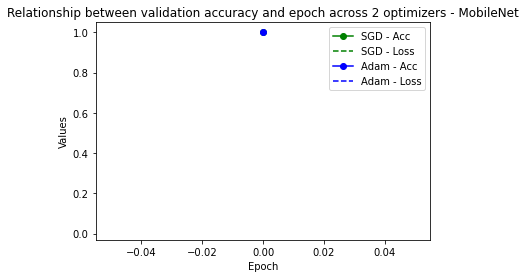

In [7]:
def plotOptimizer():
  fig = plt.figure(facecolor="w")
  plt.plot(SgdHistory.history['val_accuracy'], 'g', marker='o', label="SGD - Acc")
  plt.plot(SgdHistory.history['val_loss'], 'g',  linestyle = 'dashed', label="SGD - Loss")
  plt.plot(AdamHistory.history['val_accuracy'], 'b', marker='o', label="Adam - Acc")
  plt.plot(AdamHistory.history['val_loss'], 'b',  linestyle = 'dashed', label="Adam - Loss")
  
  plt.title('Relationship between validation accuracy and epoch across 2 optimizers - MobileNet')
  plt.xlabel('Epoch')
  plt.ylabel('Values')
  plt.legend()
  return fig

fig = plotOptimizer()
fig.show()

In [8]:
def plot_loss_acc(history, label):
  history_dict = history.history
  loss_values = history_dict["loss"]
  val_loss_values = history_dict["val_loss"]
  acc_values = history_dict["accuracy"]
  val_acc_values = history_dict["val_accuracy"]
  epochs = range(1, len(history_dict["accuracy"]) + 1)

  plt.figure(facecolor="w")
  plt.plot(epochs, loss_values, "b",marker="o", label="train")
  plt.plot(epochs, val_loss_values, "b", label="valid")
  plt.title("Loss - " + label)
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.legend()
  plt.show()

  plt.figure(facecolor="w")
  plt.plot(epochs, acc_values, "b", marker="o", label="train")
  plt.plot(epochs, val_acc_values, "b", label="valid")
  plt.title("Accuracy - " + label)
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.legend()
  plt.show()

  import numpy as np
  print("best val_acc:", np.max(val_acc_values), "epoch:", np.argmax(val_acc_values))
  print("best val_loss:", np.min(val_loss_values), "epoch:", np.argmin(val_loss_values))

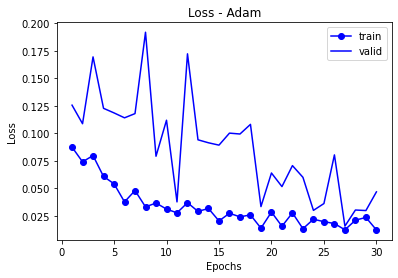

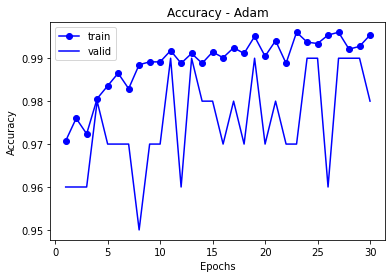

best val_acc: 0.9899999499320984 epoch: 10
best val_loss: 0.015791811048984528 epoch: 26


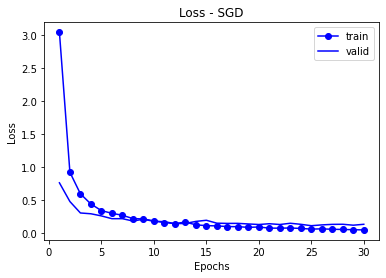

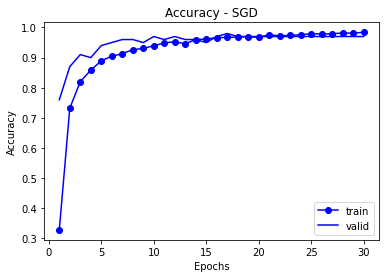

best val_acc: 0.9799999594688416 epoch: 16
best val_loss: 0.11415709555149078 epoch: 24


In [9]:
plot_loss_acc(AdamHistory, "Adam")
plot_loss_acc(SgdHistory, "SGD")

In [11]:
def plotLR(history):
    learning_rate = history.history['lr']
    epochs = range(1, len(learning_rate) + 1)
    fig = plt.figure()
    plt.plot(learning_rate[:40], history.history['val_loss'][:40])
    plt.title('Relationship between loss and learning rate')
    plt.xlabel('Learning Rate')
    plt.ylabel('Validation Loss')
    return(fig)
  
# fig = plotLR(history)
# fig.show()

# Saving Model

In [12]:
new_model.save('./models/mobile_net.h5')

## Running Predictions From Saved Model

In [13]:
def decode (predicted_arr):
  train_path = './dataset/20train'

  all_birds_cat = np.array(list(sorted(os.listdir(train_path))))
  for i, pred in enumerate(predicted_arr):
    confidence = np.round(np.max(pred) * 100, 2)
    return (all_birds_cat[np.argmax(pred)], confidence)


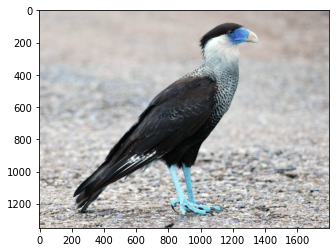

2022-05-09 04:11:50.748291: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


CRESTED CARACARA with 100.0% confidence


In [14]:
import tensorflow as tf

model = tf.keras.models.load_model('./models/mobile_net.h5')

predict_image_path = './dataset/images to test/20.jpg'

plt.imshow(cv2.imread(predict_image_path))
plt.show();

img = load_img(predict_image_path, target_size=(224,224))
img = img_to_array(img)
img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))
img = preprocess_input(img)

predictions = model.predict(img)
label, confidence = decode(predictions)

print(label + ' with ' + str(confidence) + '% confidence')

# Resources

Architectures images from [Deep Learning for Vision Systems Book](https://www.manning.com/books/deep-learning-for-vision-systems)